# Preparation

In [157]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import matplotlib
import os
import re

In [2]:
tests = {
    "10": "load-test-client-2022-01-22-16-33-31.csv",
    "20": "load-test-client-2022-01-22-16-35-04.csv",
    "30": "load-test-client-2022-01-22-16-36-27.csv",
    "40": "load-test-client-2022-01-22-16-41-53.csv",
    "50": "load-test-client-2022-01-22-16-46-25.csv",
    "60": "load-test-client-2022-01-22-16-50-37.csv",
    "70": "load-test-client-2022-01-22-16-59-25.csv",
    "80": "load-test-client-2022-01-22-17-02-45.csv",
    "90": "load-test-client-2022-01-22-17-11-33.csv",
    "100": "load-test-client-2022-01-22-17-22-49.csv",
    "110": "load-test-client-2022-01-22-17-27-58.csv",
}

def read_raw(file):
    return pd.read_csv(
        "raw/" + file,
        names=["id", "sender", "receiver", "type", "timestamp"],
    )

In [3]:
def calc_latencies_rtts(df):
    latencies = []
    rtts = []

    df_sent = df.loc[(df["type"] == "Sent")]
    for i, row in df_sent.iterrows():
        print(f"Working on row {i} of {df_sent.shape[0]}")


        received = df.loc[
            (df["type"] == "Received")
            & (df["id"] == row["id"])
            & (df["sender"] == row["sender"])
        ]

        received_by_sender = received.loc[(df["receiver"] == row["sender"])]
        if len(received_by_sender) > 0:
            rtts.append([row["id"], row["sender"], received_by_sender.iloc[0]["timestamp"] - row["timestamp"]])


        for _, r in received.iterrows():
            latencies.append([row["id"], row["sender"], row["receiver"], r["timestamp"] - row["timestamp"]])

    return latencies, rtts

In [4]:
def store_latencies_rtts(test, latencies, rtts):
    pd.DataFrame(latencies, columns=["id", "sender", "receiver", "latency"]).to_csv(f"calc/{test}-latencies.csv")
    pd.DataFrame(rtts, columns=["id", "sender", "rtt"]).to_csv(f"calc/{test}-rtts.csv")

# Calculate Latencies (Takes a While)

In [6]:
for test, file in tests.items():
    df = read_raw(file)
    latencies, rtts = calc_latencies_rtts(df)
    store_latencies_rtts(test, latencies, rtts)

Working on row 0 of 730
Working on row 1 of 730
Working on row 2 of 730
Working on row 3 of 730
Working on row 4 of 730
Working on row 5 of 730
Working on row 6 of 730
Working on row 7 of 730
Working on row 8 of 730
Working on row 9 of 730
Working on row 110 of 730
Working on row 111 of 730
Working on row 112 of 730
Working on row 113 of 730
Working on row 114 of 730
Working on row 115 of 730
Working on row 116 of 730
Working on row 117 of 730
Working on row 118 of 730
Working on row 119 of 730
Working on row 220 of 730
Working on row 221 of 730
Working on row 222 of 730
Working on row 223 of 730
Working on row 224 of 730
Working on row 225 of 730
Working on row 226 of 730
Working on row 227 of 730
Working on row 228 of 730
Working on row 229 of 730
Working on row 330 of 730
Working on row 331 of 730
Working on row 332 of 730
Working on row 333 of 730
Working on row 334 of 730
Working on row 335 of 730
Working on row 336 of 730
Working on row 337 of 730
Working on row 338 of 730
Workin

# Working with converted CSVs

In [8]:
names = [name for name in tests.keys()]
latency_files = dict(
    zip(names, [f"{name}-latencies.csv" for name in names]),
)

rtt_files = dict(
    zip(names, [f"{name}-rtts.csv" for name in names]),
)


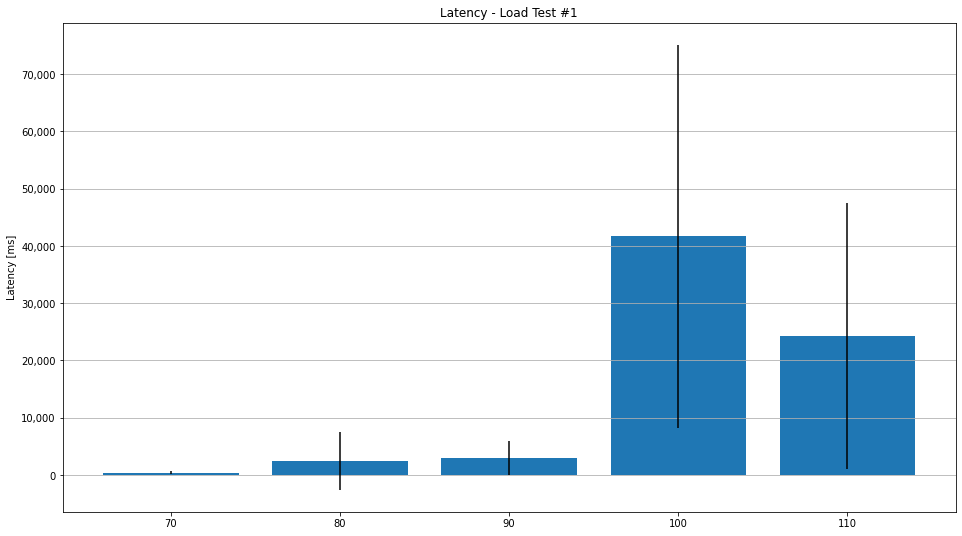

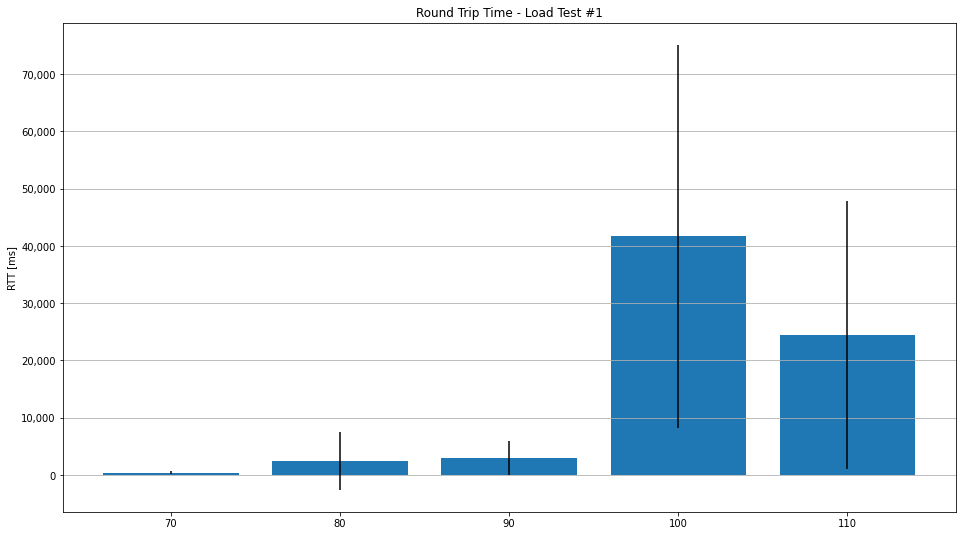

In [82]:
def render_plot(
    label: str,
    title: str,
    files: dict,
    column: str = "latency",
    filename: str | None = None,
):
    fig, ax = plt.subplots(figsize=(16, 9))

    labels = [name for name in files.keys()]
    x_pos = np.arange(len(labels))
    y_pos = []
    y_err = []

    for name, file in files.items():
        df = pd.read_csv(f"calc/{file}")
        y_pos.append(np.mean(df[column]) / 1000)
        y_err.append(np.std(df[column]) / 1000)

    ax.bar(
        x_pos,
        y_pos,
        yerr=y_err,
        align="center",
        ecolor="black",
    )
    ax.set_ylabel(f"{label} [ms]")
    ax.set_xticks(x_pos)
    ax.set_xticklabels(labels)
    ax.set_title(title)
    ax.yaxis.grid(True)

    ax.get_yaxis().set_major_formatter(
        matplotlib.ticker.FuncFormatter(lambda x, p: format(int(x), ","))
    )

    if filename:
        plt.savefig(filename)
    plt.show()


filtered_latency_files = {k: v for k, v in latency_files.items() if int(k) > 60}
filtered_rtt_files = {k: v for k, v in rtt_files.items() if int(k) > 60}

render_plot("Latency", "Latency - Load Test #1", filtered_latency_files, "latency", "out/latency_test-1.png")
render_plot("RTT", "Round Trip Time - Load Test #1", filtered_rtt_files, "rtt", "out/rtt_test-1.png")


# Percentiles

In [72]:
def calc_percentiles(files: dict):
    for name, file in files.items():
        df = pd.read_csv(f"calc/{file}")
        for i in [10, 20, 30, 40, 50, 60, 70, 80, 90, 95, 99]:
            p = int(np.round(np.percentile(df["latency"], i) / 1000))
            print(f"{name} Clients – Percentile {i}: {p} ms")
        print("-" * 80)


calc_percentiles(latency_files)


10 Clients – Percentile 10: 40 ms
10 Clients – Percentile 20: 55 ms
10 Clients – Percentile 30: 68 ms
10 Clients – Percentile 40: 76 ms
10 Clients – Percentile 50: 82 ms
10 Clients – Percentile 60: 86 ms
10 Clients – Percentile 70: 91 ms
10 Clients – Percentile 80: 98 ms
10 Clients – Percentile 90: 122 ms
10 Clients – Percentile 95: 133 ms
10 Clients – Percentile 99: 183 ms
--------------------------------------------------------------------------------
20 Clients – Percentile 10: 65 ms
20 Clients – Percentile 20: 82 ms
20 Clients – Percentile 30: 93 ms
20 Clients – Percentile 40: 102 ms
20 Clients – Percentile 50: 114 ms
20 Clients – Percentile 60: 129 ms
20 Clients – Percentile 70: 145 ms
20 Clients – Percentile 80: 171 ms
20 Clients – Percentile 90: 291 ms
20 Clients – Percentile 95: 559 ms
20 Clients – Percentile 99: 1092 ms
--------------------------------------------------------------------------------
30 Clients – Percentile 10: 86 ms
30 Clients – Percentile 20: 105 ms
30 Client

In [125]:
def render_percentiles_individually(files: dict):
    dfs = dict()

    for name, file in files.items():
        dfs[name] = pd.read_csv(f"calc/{file}")

    total_max = 0
    for name, df in dfs.items():
        max = df["latency"].max()
        if max > total_max:
            total_max = max
    total_max = total_max / 1000

    for name, df in dfs.items():
        fig, ax = plt.subplots(figsize=(16, 9))

        percentiles = [10, 20, 30, 40, 50, 60, 70, 80, 90, 95, 99]

        x_pos = np.arange(len(percentiles))
        y_pos = []
        
        for i in percentiles:
            y_pos.append(np.percentile(df["latency"], i) / 1000)

        ax.bar(
            x_pos,
            y_pos,
            align="center",
            ecolor="black",
        )
        ax.set_ylabel("Latency [ms]")
        ax.set_xlabel("Percentile")
        ax.set_xticks(x_pos)
        ax.set_xticklabels(percentiles)
        ax.set_title(f"Latency Percentiles for {name} clients – Load Test #1")
        ax.yaxis.grid(True)

        ax.set_ylim((0, total_max))

        ax.get_yaxis().set_major_formatter(
            matplotlib.ticker.FuncFormatter(lambda x, p: format(int(x), ","))
        )

        plt.savefig(f"out/{name}-percentiles_test-1.png")
        plt.show()

#render_percentiles_individually(latency_files)

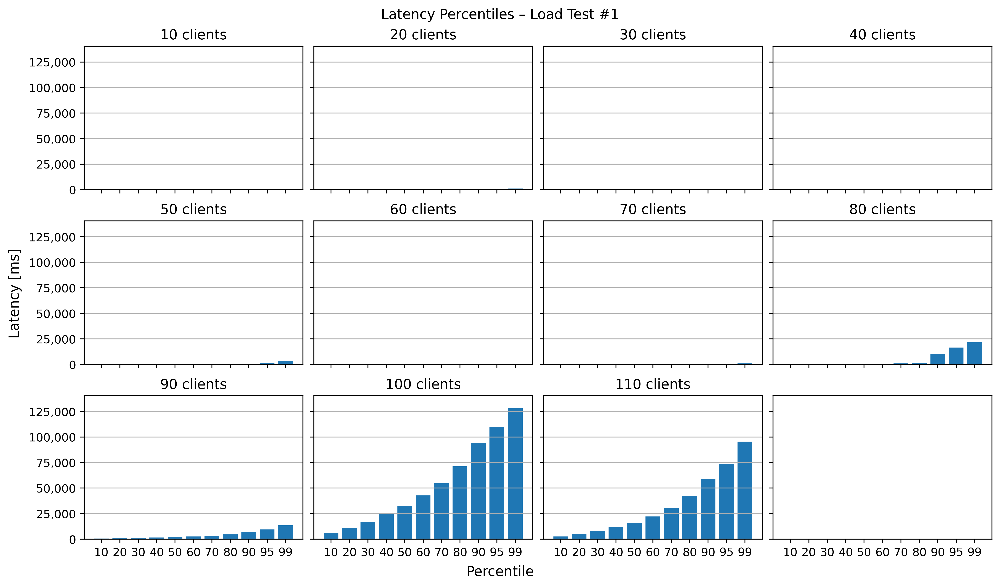

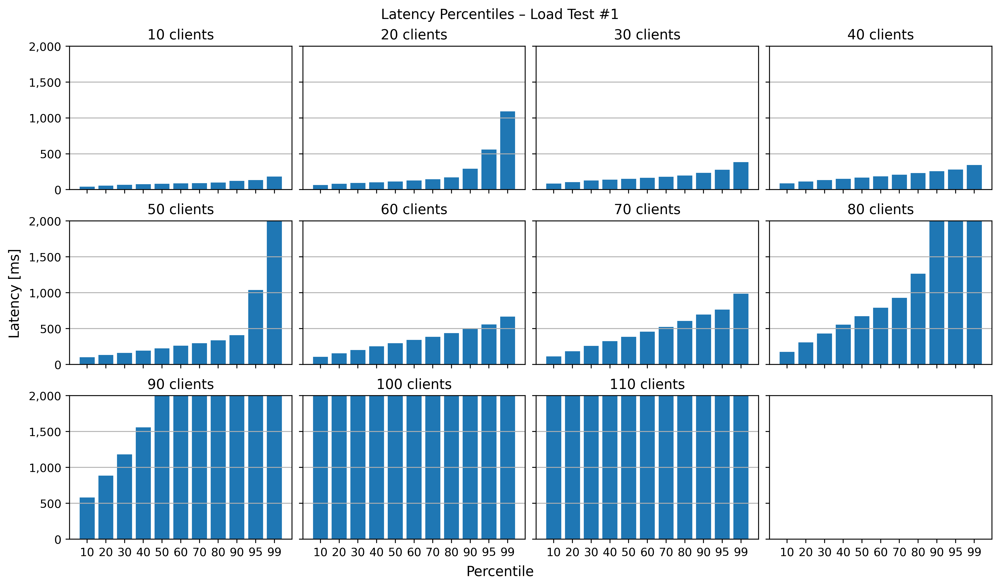

In [127]:
def render_percentiles(files: dict, filename: str|None = None, y_lim = None):
    percentiles = [10, 20, 30, 40, 50, 60, 70, 80, 90, 95, 99]
    dfs = dict()

    for name, file in files.items():
        dfs[name] = pd.read_csv(f"calc/{file}")

    total_max = 0
    for name, df in dfs.items():
        max = df["latency"].max()
        if max > total_max:
            total_max = max
    total_max = total_max / 1000

    fig, axs = plt.subplots(
        int(np.ceil(len(files) / 4)),
        4,
        figsize=(12, 7),
        constrained_layout=True,
        sharex=True,
        sharey=True,
    )

    axs = axs.flatten()

    for ax, (name, df) in zip(axs, dfs.items()):

        x_pos = np.arange(len(percentiles))
        y_pos = []

        for perc in percentiles:
            y_pos.append(np.percentile(df["latency"], perc) / 1000)

        ax.bar(x_pos, y_pos, align="center")
        ax.set_xticks(x_pos)
        ax.set_xticklabels(percentiles)
        ax.set_title(f"{name} clients")
        ax.yaxis.grid(True)

        if y_lim:
            ax.set_ylim((0, y_lim))
        else:
            ax.set_ylim((0, total_max))

        ax.get_yaxis().set_major_formatter(
            matplotlib.ticker.FuncFormatter(lambda x, p: format(int(x), ","))
        )

    fig.suptitle("Latency Percentiles – Load Test #1")
    fig.supxlabel("Percentile")
    fig.supylabel("Latency [ms]")
    fig.set_dpi(400)

    if filename:
        plt.savefig(filename)
    plt.show()


render_percentiles(latency_files, f"out/percentiles_test-1.png")
render_percentiles(latency_files, f"out/percentiles-lim-2000_test-1.png", y_lim=2000)


# Check for Message Drops

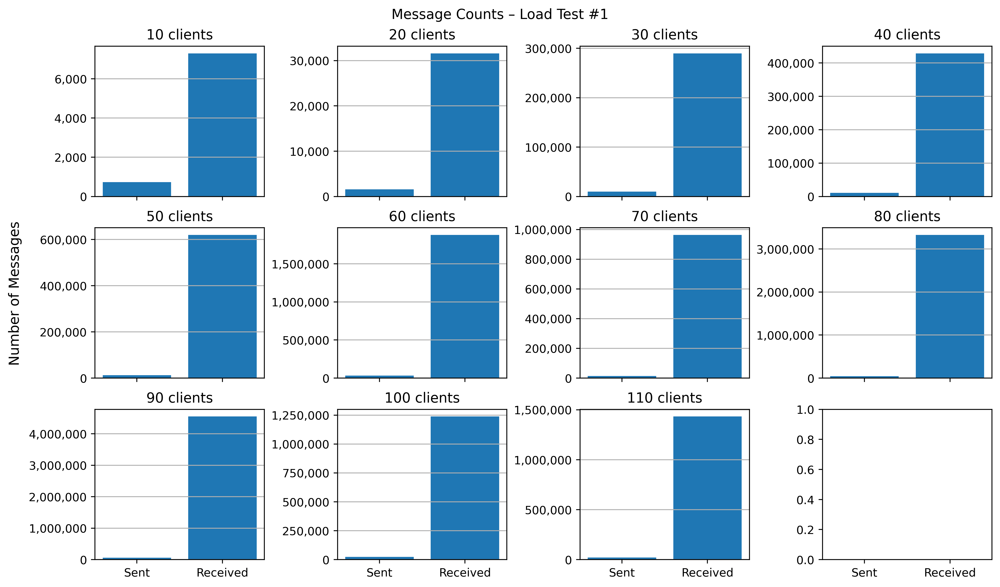

In [164]:
def render_message_counts(files: dict, filename: str | None = None):
    categories = ["Sent", "Received"]

    fig, axs = plt.subplots(
        int(np.ceil(len(files) / 4)),
        4,
        figsize=(12, 7),
        constrained_layout=True,
        sharex=True,
    )

    axs = axs.flatten()

    for ax, (name, file) in zip(axs, files.items()):
        df = pd.read_csv(
            f"raw/{file}", names=["id", "sender", "receiver", "type", "timestamp"]
        )

        x_pos = np.arange(len(categories))
        y_pos = []

        for cat in categories:
            y_pos.append(df.loc[df["type"] == cat].shape[0])

        ax.bar(x_pos, y_pos, align="center")
        ax.set_xticks(x_pos)
        ax.set_xticklabels(categories)
        ax.set_title(f"{name} clients")
        ax.yaxis.grid(True)

        ax.get_yaxis().set_major_formatter(
            matplotlib.ticker.FuncFormatter(lambda x, p: format(int(x), ","))
        )

    fig.suptitle("Message Counts – Load Test #1")
    fig.supylabel("Number of Messages")
    fig.set_dpi(400)

    if filename:
        plt.savefig(filename)
    plt.show()


render_message_counts(tests, f"out/message-counts_test-1.png")


In [148]:
# for name, file in tests.items():
#     print(f"Testing {name} clients file...")
#     df = pd.read_csv(
#         f"raw/{file}", names=["id", "sender", "receiver", "type", "timestamp"]
#     )
#     df_sent = df.loc[df["type"] == "Sent"].drop_duplicates(
#         subset=["id", "sender"], keep="first"
#     )

#     num_clients = int(name)
#     num_sent = df_sent.shape[0]

#     for i, row in df_sent.iterrows():
#         num_received = df.loc[
#             (df["type"] == "Received")
#             & (df["id"] == row["id"])
#             & (df["sender"] == row["sender"])
#         ].shape[0]
#         p = (num_received / num_clients) * 100

#         if p < 100:
#             print(
#                 f"{name} clients -",
#                 f"expected {num_clients},",
#                 f"received {num_received}",
#                 f"-> {p} %",
#             )
#     print("-"*80)


In [166]:
def tryint(s):
    try:
        return int(s)
    except:
        return s

def alphanum_key(s):
    """ Turn a string into a list of string and number chunks.
        "z23a" -> ["z", 23, "a"]
    """
    return [ tryint(c) for c in re.split('([0-9]+)', s) ]


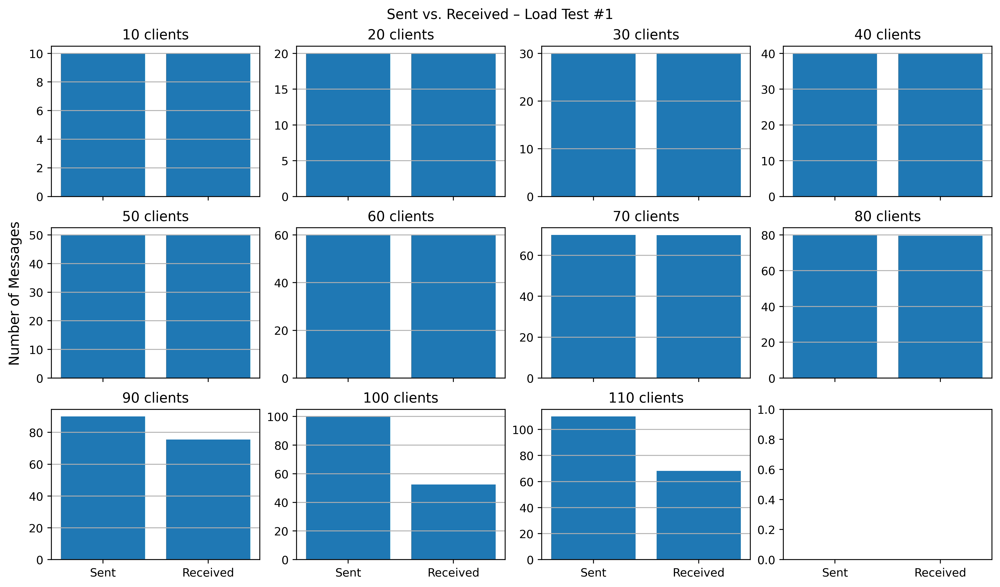

In [167]:
def render_received_vs_sent(filename: str | None = None):
    categories = ["Sent", "Received"]

    files = os.listdir("received-vs-sent")
    files = sorted(files, key=alphanum_key)

    fig, axs = plt.subplots(
        int(np.ceil(len(files) / 4)),
        4,
        figsize=(12, 7),
        constrained_layout=True,
        sharex=True,
    )

    axs = axs.flatten()

    for ax, file in zip(axs, files):
        df = pd.read_csv(
            f"received-vs-sent/{file}",
            names=["received", "sent"],
        )

        x_pos = np.arange(2)

        ax.bar(x_pos, [df[cat.lower()].mean() for cat in categories], align="center")

        ax.set_xticks(x_pos)
        ax.set_xticklabels(categories)
        ax.set_title(f"{os.path.splitext(file)[0]} clients")
        ax.yaxis.grid(True)

        ax.get_yaxis().set_major_formatter(
            matplotlib.ticker.FuncFormatter(lambda x, p: format(int(x), ","))
        )

    fig.suptitle("Sent vs. Received – Load Test #1")
    fig.supylabel("Number of Messages")
    fig.set_dpi(400)

    if filename:
        plt.savefig(filename)
    plt.show()


render_received_vs_sent(f"out/sent-vs-received_test-1.png")
